## 1. Feature Importance

## Introduction

The main idea is to derive explanation by investigating the importance scores of different features used to output the final prediction. 
For this, it is suitable any kind of feature:  manual features obtained from feature engineering, lexical features, latent features learned by NNs, etc. Attention is one of the features that has been widely used in the literature to show and visualize this. 

There are several approaches of this kind, in fact, this might be the technique that is more common when trying to explain AI, since it comprehends a wide range of possibilities. Here we list some interesting approaches:

* **Integrated Gradients** from the paper [Axiomatic Attribution for Deep Networks](https://arxiv.org/abs/1703.01365)is a method for attributing feature importance to each input feature of a deep neural network by computing the integral of the gradients of the output with respect to the input along a straight-line path from a baseline input to the actual input.
* **DeepLIFT (Deep Learning Important FeaTures)**, from the paper [Learning Important Features Through Propagating Activation Differences
](https://arxiv.org/abs/1704.02685) is a method for attributing feature importance to the input features of a deep neural network. DeepLIFT works by comparing the activations of each neuron in the network under the actual input with the activations that would have been produced by a reference input, and then using the difference to attribute importance scores to the input features.
* **BertViz** an interactive tool for visualizing attention in Transformer language models such as BERT, GPT2, or T5.
* **Representation erasure** from the paper [Understanding neural networks through representation erasure](https://arxiv.org/pdf/1612.08220.pdf), in which they evaluate the relevance of a given embedding dimension.

We will experiment with the two latter ones.

## Experiments - BertViz

For our experiments, first, we will showcase how to use [bertviz](https://github.com/jessevig/bertviz). It is one of the most well-known libraries (if not the most) that plays and interacts with attention weights (among others). We will use this library in our finetuned model.

In [9]:
from bertviz import head_view, model_view

from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
from src.preprocess import get_train_dev_test_data

In [5]:
# Uncomment this to finetune the model!
# it takes a while, so it is commented to avoid re-doing the same step several times

# !python3 src/finetune.py

Map: 100%|███████████████████████████| 103/103 [00:00<00:00, 3175.40 examples/s]
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at google-bert/bert-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
{'train_runtime': 2493.7448, 'train_samples_per_second': 1.198, 'train_steps_per_second': 0.15, 'train_loss': 0.579322021484375, 'epoch': 3.0}
100%|█████████████████████████████████████████| 375/375 [41:33<00:00,  6.65s/it]


In [10]:
tokenizer = AutoTokenizer.from_pretrained("google-bert/bert-base-cased")
model = AutoModelForSequenceClassification.from_pretrained(
    "pretrained_model/", num_labels=4, output_attentions=True
)

In [11]:
_, _, test = get_train_dev_test_data()

In [12]:
print(f'{test["verse_text"][73]}')
print(f'{test["verse_text"][74]}')

I'd like to be my old self again
But I'm still tryin' to find it


In [13]:
def prepare_data(sentence_a, sentence_b):
    inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors="pt")
    input_ids = inputs["input_ids"]
    token_type_ids = inputs["token_type_ids"]
    attention = model(input_ids, token_type_ids=token_type_ids)[-1]
    sentence_b_start = token_type_ids[0].tolist().index(1)
    input_id_list = input_ids[0].tolist()  # Batch index 0
    tokens = tokenizer.convert_ids_to_tokens(input_id_list)
    return attention, tokens, sentence_b_start

In [21]:
attention, tokens, sentence_b_start = prepare_data(
    test["verse_text"][73], test["verse_text"][74]
)
html_head = head_view(attention, tokens, sentence_b_start, html_action="return")

In [26]:
html_head

In [24]:
html_model = model_view(attention, tokens, sentence_b_start, html_action="return")
html_model

## Experiments - Representation erasure

The second approach we will showcase a variation of [Understanding neural networks through representation erasure](https://arxiv.org/pdf/1612.08220.pdf). In the paper, they evaluate the importance of a dimension of a feature by deleting it and comparing how that affects to the loglikelihood of the prediction. They propose the following metric:

$S(e,c,\neg d): I(d) = \dfrac{1}{|E|} \displaystyle\sum_{e\in E} \dfrac{S(e,c) - S(e,c,\neg d)}{S(e,c)}$

Where:
* $e$ : training example
* $c$ : the class where e belongs to (ground truth).
* $S(e, c)$ : log-likelihood assigned by model M to the correct label for e $(−log P(L_e = c)$.
* $L_e$ : label assigned to example $e$ by the classification algorithm.
* $S(e, c, ¬d)$ : denote the log-likelihood of the correct label for $e$ according to $M$ if dimension d is erased
* $I(d)$ : importance of $d$

The original paper uses the metric to test the relevance of the embeddings dimension and computes it using all the training set. We can tweak a bit this metric to make it example driven.
For a given sentence that we want, we will apply the erasure score with the words that form the sentence and see how much the word affects to the final logits.


To test our proposed approach, we will take our pretrained model and input a sentence of our test. We will erase different words from the input sentence and evaluate its importance according the metric proposed by Li et al.

In [ ]:
# Uncomment this to finetune the model!
# it takes a while, so it is commented to avoid re-doing the same several times

# !python3 src/finetune.py

In [ ]:
from transformers import AutoModelForSequenceClassification
from transformers import TextClassificationPipeline
from transformers import AutoTokenizer
from src.preprocess import get_train_dev_test_data

import plotly.figure_factory as ff

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("google-bert/bert-base-cased")
model = AutoModelForSequenceClassification.from_pretrained(
    "pretrained_model/", num_labels=4
)

pipe = TextClassificationPipeline(model=model, tokenizer=tokenizer)

In [ ]:
_, _, test = get_train_dev_test_data()
labels = ["negative", "positive", "neutral", "mixed"]

sample = test[32]

In [ ]:
sample

{'verse_text': 'And you held my lifeless frame', 'labels': 0}

In [ ]:
pipe(sample["verse_text"], return_all_scores=True)

/Users/mariaribalta/Documents/EHU/DeepLearning/FinalProject/venv/lib/python3.12/site-packages/transformers/pipelines/text_classification.py:105: UserWarning:

`return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.



[[{'label': 'LABEL_0', 'score': 0.9870206713676453},
  {'label': 'LABEL_1', 'score': 0.0008933398639783263},
  {'label': 'LABEL_2', 'score': 0.00396553473547101},
  {'label': 'LABEL_3', 'score': 0.008120451122522354}]]

In [ ]:
def compute_classification_scores(sentence, pipe):
    split_sentence = sentence.split(" ")
    original_sentence_score = pipe(sentence, top_k=4)
    results_removed_word = dict()

    for idx in range(len(split_sentence)):
        removed_word_sentence = " ".join(
            split_sentence[:idx] + split_sentence[idx + 1 :]
        )
        score = pipe(removed_word_sentence, top_k=4)
        results_removed_word[removed_word_sentence] = sorted(
            score, key=lambda x: x["label"]
        )

    return (
        sorted(original_sentence_score, key=lambda x: x["label"]),
        results_removed_word,
    )

In [ ]:
def compute_importance_score(original_sentence_score, results_removed_word):
    sentences = list(results_removed_word.keys())
    scores_matrix = []

    for word_idx in range(len(sentences)):
        scores_row = []
        for label_idx in range(4):
            current_score = results_removed_word[sentences[word_idx]][label_idx][
                "score"
            ]
            original_score = original_sentence_score[label_idx]["score"]

            scores_row.append((original_score - current_score) / original_score)
        scores_matrix.append(scores_row)

    return scores_matrix

In [ ]:
sentence = sample["verse_text"]
split_sentence = sentence.split(" ")
original_sentence_score, results_removed_word = compute_classification_scores(
    sentence, pipe
)
scores_matrix = compute_importance_score(original_sentence_score, results_removed_word)

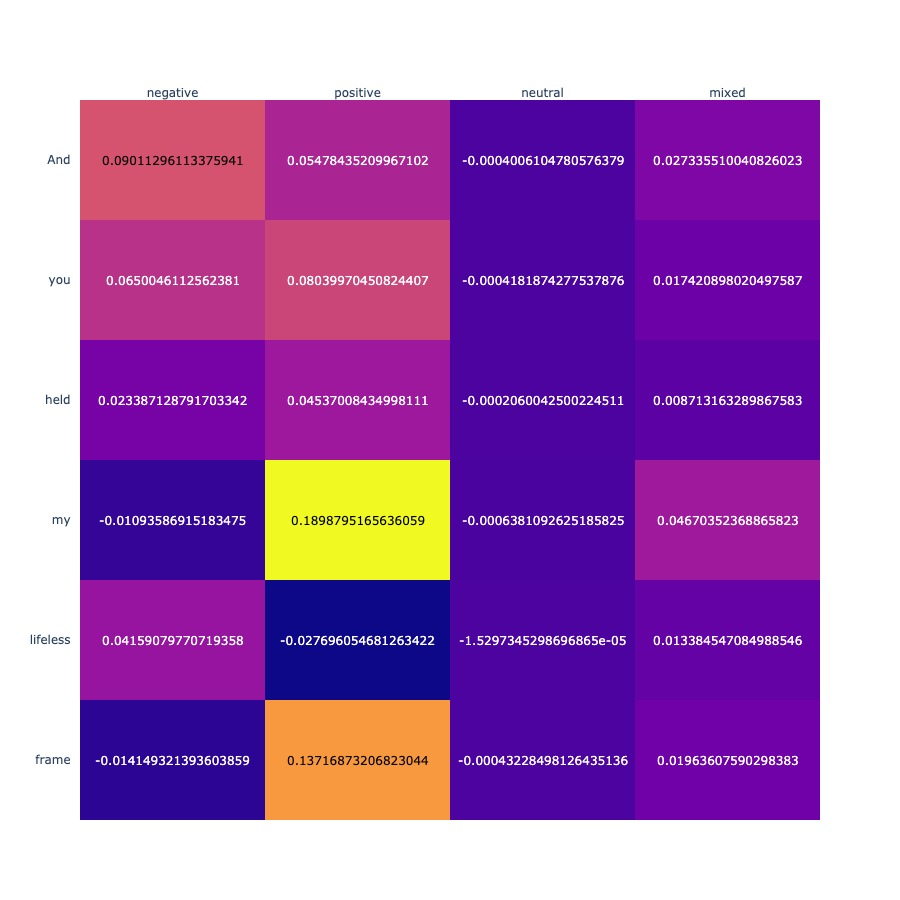

In [ ]:
fig = ff.create_annotated_heatmap(scores_matrix, x=labels, y=split_sentence)

fig["layout"]["yaxis"]["autorange"] = "reversed"
fig.show(renderer="jpg", width=900, height=900)

Now let's try with more examples and see which words are more relevant towards the decision of some classifications!
We will encapsulate the whole process in a function, to avoid repeating chunks of code:

In [ ]:
def compute_scores_matrix(sample_nr):
    sentence = test[sample_nr]["verse_text"]
    split_sentence = sentence.split(" ")
    original_sentence_score, results_removed_word = compute_classification_scores(
        sentence, pipe
    )
    scores_matrix = compute_importance_score(
        original_sentence_score, results_removed_word
    )

    fig = ff.create_annotated_heatmap(scores_matrix, x=labels, y=split_sentence)
    fig["layout"]["yaxis"]["autorange"] = "reversed"
    fig.show(renderer="jpg", width=900, height=900)

    return scores_matrix

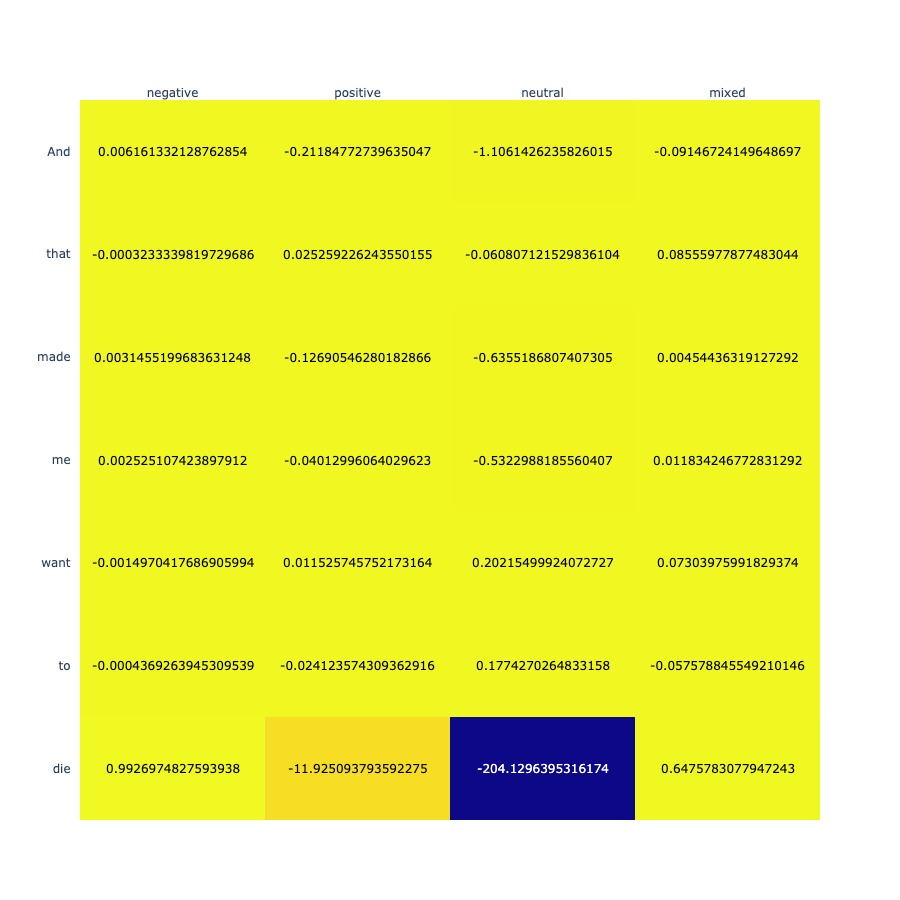

In [ ]:
scores_matrix = compute_scores_matrix(59)

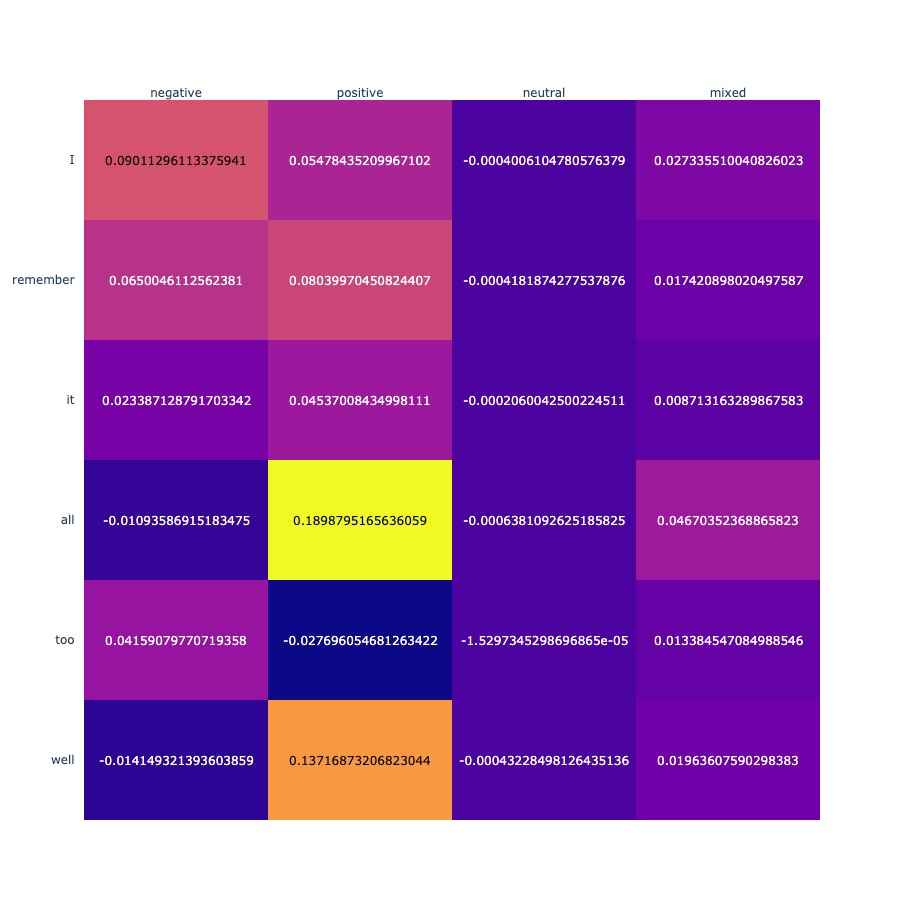

In [ ]:
scores_matrix = compute_scores_matrix(100)

## Conclusions

Pàgina 39 (https://arxiv.org/pdf/2004.14545.pdf)
The use of attention-based deep learning models for NLP have increased significantly [Vaswani
et al., 2017, Brown et al., 2020]. Attention has often been argued to be intrinsically interpretable, see Section 2.3. However, recent studies [Jain and Wallace, 2019, Serrano and Smith, 2019, Baan et al., 2019] show that attention is not always interpretable and that attention does not always lead to insight into model prediction. [Jain and Wallace, 2019]
first raises the point that, while we make the assumption that attention is implicitly interpretable because directly it provides insight into which words are important, this assumption has never been formally evaluated. That is, the relationship between attention weights and model output is not clear. The experiments of their results show that correlation between feature importance measures, like heatmapping, and the learned attention weights is weak.
The results suggest that the ability of attention modules to provide meaningful explanations into model prediction is questionable at best. [Serrano and Smith, 2019] manipulates the attention weights in trained models and analyzes the resulting difference in model predictions. Their findings are mixed: sometimes higher attention weights correlate to model predictions but not always. [Baan et al., 2019] reveals that some attention heads tend to specialize towards interpretable parts of a document, but this ability does not generalize to all documents. Also the specializations are not consistent over differently initialized models.